# Model validation

---
### PREAMBLE

#### Set path to priorize local weac installation (over pypi)

In [1]:
import sys
sys.path.insert(1, '/Users/Florian Rheinschmidt/Documents/Forschung/Lawine/Python/repo/weac')

#### Modules

In [9]:
# Third party imports
import numpy as np
import matplotlib.pyplot as plt

# Individual function imports
from pprint import pprint
from scipy.integrate import cumulative_trapezoid

# Project impots
import weac

#### Autoreload modules

In [3]:
%load_ext autoreload
%autoreload 2

#### Output and plot setup

In [4]:
# Outputs
np.set_printoptions(precision=3, linewidth=80, suppress=True)

# Plot magic
%matplotlib inline
#%config InlineBackend.figure_formats = 'svg'

# Plot setup
plt.rcdefaults()
plt.rc('font', family='serif', size=9)
plt.rc('mathtext', fontset='cm')
cycler = plt.rcParams['axes.prop_cycle']
colors = cycler.by_key()['color']

#### Profile pictograms

In [5]:
def plot_profile_pictogram(instance, ax1):
    """Create bar chart inset of slab profile."""
    ax1.set_axis_off()

    # Initialize coordinates
    x = []
    y = []
    sep = []
    total_heigth = 0

    for line in np.flipud(instance.slab):
        x.append(line[0] - 20)
        x.append(line[0] - 20)
        
        sep.append(total_heigth)
        
        y.append(total_heigth)
        total_heigth = total_heigth + line[1]
        y.append(total_heigth)
    
    ax1.set_xlim(400, -50)

    ax1.fill_betweenx([-80, 0], 0, [100, 100], color='silver', edgecolor=None)
    ax1.fill_betweenx(y, 0, x, color='dimgrey', edgecolor=None)
    ax1.axhline(-80, linewidth=1, color='black')
    for s in sep:
        ax1.axhline(s, linewidth=.4, color='white')

---
### ANALYSIS

### Compute stresses, plot, and export stresses

True
True
True
True
True
True


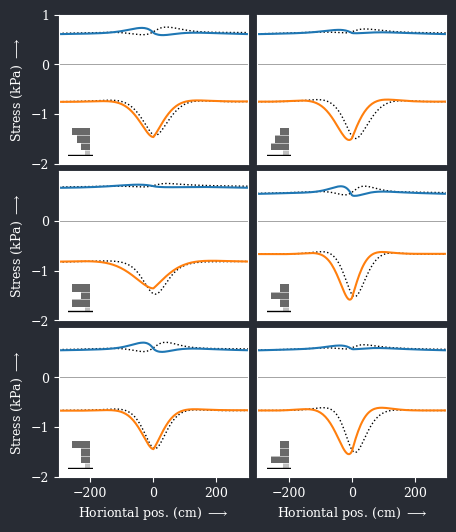

In [6]:
# Inputs
profiles = ['A', 'B', 'C', 'D', 'E', 'F']  # List of reference profile names
phi = 38                                   # Slope inclination (°)

# Initialize models for all profiles
skiers = [weac.Layered(system='skier', layers=p) for p in profiles]

# Update weak-layer thickness to match FEA
for skier in skiers:
    skier.set_foundation_properties(t=20, E=0.15, update=True)

# Calculate segmentation (same for all profiles)
ssgmts = skiers[0].calc_segments(L=1e4, a=0, m=80)['nocrack']

with plt.style.context('dark_background'):
    
    # Create figure
    fig, axs = plt.subplots(3, 2, constrained_layout=False, figsize=(5,6))
    axs = axs.flatten()
    plt.subplots_adjust(wspace=.05, hspace=.05)
    
    # Match figure and VS code background colors. Theme colors can be found at
    # cmd+shift+P > Developer: Generate Color Theme From Current Settings
    # For background colors see "colors": {"editor.background": ...}
    fig.set_facecolor('#282c34')

    # Adjust grid layout
    [axs[i].xaxis.set_visible(False) for i in range(4)]
    [axs[i].yaxis.set_visible(False) for i in [1,3,5]]
    [axs[i].set_ylabel(r'Stress (kPa) $\longrightarrow$') for i in [0,2,4]]
    [axs[i].set_xlabel(r'Horiontal pos. (cm) $\longrightarrow$') for i in [-1, -2]]

    # Loop through list of models
    for i, skier in enumerate(skiers):

        # Dack background but light inside axes
        axs[i].set_prop_cycle(cycler)
        axs[i].set_facecolor('white')

        # Assemble model for segments and solve for free constants
        C = skier.assemble_and_solve(phi=phi, **ssgmts)
        
        # Rasterize the solution
        xsl, z, xwl = skier.rasterize_solution(C=C, phi=phi, **ssgmts)
        
        # Get normal and shear stresses
        xwl_cm, sig = skier.get_weaklayer_normalstress(x=xwl, z=z, unit='kPa')
        xwl_cm, tau = skier.get_weaklayer_shearstress(x=xwl, z=z, unit='kPa')
        
        # Import FEA reference data
        pre = 'data/stresses_weak_layer_skier_layersetup_'
        ext = '_slope_38_crack_left.npy'
        fem = np.loadtxt(pre + profiles[i] + ext)
        
        # Plot zero axis
        axs[i].axhline(0, linewidth=0.5, color='gray')
        
        # Plot FEA data
        axs[i].plot(fem[:, 0]/10 - 5e2, 1e3*np.flip(fem[:, 2]), 'k:', linewidth=1)
        axs[i].plot(fem[:, 0]/10 - 5e2, -1e3*np.flip(fem[:, 3]), 'k:', linewidth=1)
        
        # Plot model data
        axs[i].plot(xwl_cm - 5e2, tau)
        axs[i].plot(xwl_cm - 5e2, sig)
        
        # Show profiles
        inax = axs[i].inset_axes([.05, .05, .13, .20])
        plot_profile_pictogram(skier, inax)
        # axs[i].set_title(profiles[i], x=0.08, y=0.02)
        
        # Plot setup
        axs[i].set_xlim([-300, 300])
        axs[i].set_ylim([-2, 1])
        
    # Remove overlapping tick labels
    [axs[i].set_yticks(axs[i].get_yticks()[:-1]) for i in [2, 4]];

True


FileNotFoundError: [Errno 2] No such file or directory: 'data/ski/A/present'

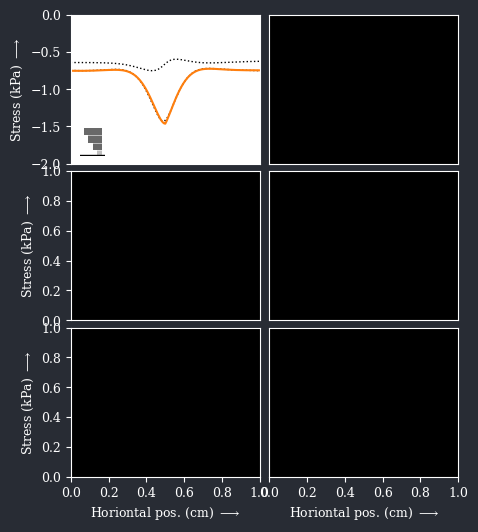

In [44]:
# Inputs
profiles = ['A', 'B', 'C', 'D', 'E', 'F']  # List of reference profile names
phi = 38                                   # Slope inclination (°)

# Initialize models for all profiles
skiers = [weac.Layered(system='skier', layers=p) for p in profiles]

# Update weak-layer thickness to match FEA
for skier in skiers:
    skier.set_foundation_properties(t=20, E=0.15, update=True)

# Calculate segmentation (same for all profiles)
ssgmts = skiers[0].calc_segments(L=1e4, a=0, m=80)['nocrack']

with plt.style.context('dark_background'):

    # Create figure
    fig, axs = plt.subplots(3, 2, constrained_layout=False, figsize=(5,6))
    axs = axs.flatten()
    plt.subplots_adjust(wspace=.05, hspace=.05)

    # Match figure and VS code background colors. Theme colors can be found at
    # cmd+shift+P > Developer: Generate Color Theme From Current Settings
    # For background colors see "colors": {"editor.background": ...}
    fig.set_facecolor('#282c34')

    # Adjust grid layout
    [axs[i].xaxis.set_visible(False) for i in range(4)]
    [axs[i].yaxis.set_visible(False) for i in [1,3,5]]
    [axs[i].set_ylabel(r'Stress (kPa) $\longrightarrow$') for i in [0,2,4]]
    [axs[i].set_xlabel(r'Horiontal pos. (cm) $\longrightarrow$') for i in [-1, -2]]

    # Loop through list of models
    for i, skier in enumerate(skiers):
        
        # Dack background but light inside axes
        axs[i].set_prop_cycle(cycler)
        axs[i].set_facecolor('white')

        # Assemble model for segments and solve for free constants
        C = skier.assemble_and_solve(phi=phi, **ssgmts)
        
        # Rasterize the solution
        xsl, z, xwl = skier.rasterize_solution(C=C, phi=phi, **ssgmts)
        
        # Get normal and shear stresses
        xwl_cm, sig = skier.get_weaklayer_normalstress(x=xwl, z=z, unit='kPa')
        xwl_cm, tau = skier.get_weaklayer_shearstress(x=xwl, z=z, unit='kPa')
        
        # Import FEA reference data
        pre = 'data/stresses_weak_layer_skier_layersetup_'
        ext = '_slope_38_crack_left.npy'
        fem = np.loadtxt(pre + profiles[i] + ext)
        
        # Plot zero axis
        axs[i].axhline(0, linewidth=0.5, color='gray')
        
        # Plot FEA data
        axs[i].plot(fem[:, 0]/10 - 5e2, 1e3*fem[:, 2], 'k:', linewidth=1)
        axs[i].plot(fem[:, 0]/10 - 5e2, 1e3*fem[:, 3], 'k:', linewidth=1)
        
        # Plot model data
        axs[i].plot(xwl_cm - 5e2, tau)
        axs[i].plot(xwl_cm - 5e2, sig)

        # Show profiles
        inax = axs[i].inset_axes([.05, .05, .13, .20])
        plot_profile_pictogram(skier, inax)
        # axs[i].set_title(profiles[i], x=0.08, y=0.02)
        
        # Plot setup
        axs[i].set_xlim([-300, 300])
        axs[i].set_ylim([-2, 0])
        
        # Assemble outputs
        present = np.vstack([
            xwl_cm - 5e2,            # x (cm) with centered skier
            sig,                     # sig (kPa)
            tau                      # tau (kPa)
        ]).T
        fea = np.vstack([
            fem[::10, 0]/10 - 5e2,      # x (cm) with centered skier
            1e3*fem[::10, 2],           # sig (kPa)
            1e3*fem[::10, 3]            # tau (kPa)
        ]).T
        
        # Write outputs to files
        path = f'data/ski/{profiles[i]}'
        np.savetxt(f'{path}/present', present, header='x sig tau', comments='')
        np.savetxt(f'{path}/reference', fea, header='x sig tau', comments='')
        
    # Remove overlapping tick labels
    [axs[i].set_yticks(axs[i].get_yticks()[:-1]) for i in [2, 4]];

### Upslope cut from right

[-375. -255. -135.  -15.]
[-375. -255. -135.  -15.]
[-375. -255. -135.  -15.]
[-375. -255. -135.  -15.]
[-375. -255. -135.  -15.]
[-375. -255. -135.  -15.]
[-370. -250. -130.  -10.]
[-370. -250. -130.  -10.]
[-370. -250. -130.  -10.]
[-370. -250. -130.  -10.]
[-370. -250. -130.  -10.]
[-370. -250. -130.  -10.]
[[-0.003]
 [-0.007]
 [-0.003]
 [-0.007]]
[[-1.687e-108  3.686e-002  1.093e-040 -3.128e-005 -5.295e+000  7.565e+000
   7.294e-002 -6.239e-001  9.582e-003  8.196e-002  0.000e+000  0.000e+000
   0.000e+000  0.000e+000  0.000e+000  0.000e+000]
 [ 1.686e-107 -3.683e-001 -6.845e-037  1.959e-001  1.447e+003 -2.067e+003
  -1.635e+001  1.398e+002  8.379e+001  7.167e+002  0.000e+000  0.000e+000
   0.000e+000  0.000e+000  0.000e+000  0.000e+000]
 [-4.406e-113 -9.625e-007  1.329e-037  3.802e-002  5.736e-001  8.194e-001
  -2.050e-001 -1.754e+000  1.674e-001 -1.432e+000  0.000e+000  0.000e+000
   0.000e+000  0.000e+000  0.000e+000  0.000e+000]
 [-2.046e-004 -9.369e-111  8.711e-004  3.044e-039 

NameError: name 'skier' is not defined

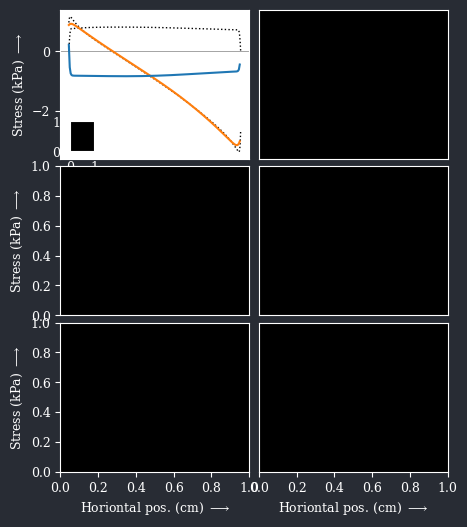

In [6]:
# Inputs
profiles = ['A', 'B', 'C', 'D', 'E', 'F']  # List of reference profile names
phi = -38                                   # Slope inclination (°)
sys = 'pst-'

# Initialize models for all profiles
psts = [weac.Layered(system=sys, layers=p) for p in profiles]

# Update weak-layer thickness to match FEA
for pst in psts:
    pst.set_foundation_properties(t=20, E=0.15, update=True)

# Calculate segmentation (same for all profiles)
psgmts = psts[0].calc_segments(L=1200, a=300)['crack']

with plt.style.context('dark_background'):

    # Create figure
    fig, axs = plt.subplots(3, 2, constrained_layout=False, figsize=(5,6))
    axs = axs.flatten()
    plt.subplots_adjust(wspace=.05, hspace=.05)

    # Match figure and VS code background colors. Theme colors can be found at
    # cmd+shift+P > Developer: Generate Color Theme From Current Settings
    # For background colors see "colors": {"editor.background": ...}
    fig.set_facecolor('#282c34')

    # Adjust grid layout
    [axs[i].xaxis.set_visible(False) for i in range(4)]
    [axs[i].yaxis.set_visible(False) for i in [1,3,5]]
    [axs[i].set_ylabel(r'Stress (kPa) $\longrightarrow$') for i in [0,2,4]]
    [axs[i].set_xlabel(r'Horiontal pos. (cm) $\longrightarrow$') for i in [-1, -2]]

    # Loop through list of models
    for i, pst in enumerate(psts):

        # Dack background but light inside axes
        axs[i].set_prop_cycle(cycler)
        axs[i].set_facecolor('white')

        # Assemble model for segments and solve for free constants
        C = pst.assemble_and_solve(phi=phi, **psgmts)
        
        # Rasterize the solution
        xsl, z, xwl = pst.rasterize_solution(C=C, phi=phi, **psgmts)
        
        # Get normal and shear stresses
        xwl_cm, sig = pst.get_weaklayer_normalstress(x=xwl, z=z, unit='kPa')
        xwl_cm, tau = pst.get_weaklayer_shearstress(x=xwl, z=z, unit='kPa')
        
        # Assemble output and write to file
        output = np.vstack([xwl_cm, tau, sig]).T
        
        # Import FEA reference data
        pre = 'data/stresses_weak_layer_pst_layersetup_'
        ext = '_slope_38_crack_left.npy'
        fem = np.loadtxt(pre + profiles[i] + ext)
        
        # Plot zero axis
        axs[i].axhline(0, linewidth=0.5, color='gray')
        
        # Plot FEA data
        axs[i].plot(fem[:, 0]/10 - 30, 1e3*np.flip(fem[:, 2]), 'k:', linewidth=1)
        axs[i].plot(fem[:, 0]/10 - 30, -1e3*np.flip(fem[:, 3]), 'k:', linewidth=1)
        
        # Plot model data
        axs[i].plot(xwl_cm, sig, colors[1])
        axs[i].plot(xwl_cm, tau, colors[0])
        
        # Show profiles
        inax = axs[i].inset_axes([.05, .05, .13, .20])
        plot_profile_pictogram(skier, inax)
        # axs[i].set_title(profiles[i], x=0.08, y=0.02)
        
        # Plot setup
        axs[i].set_xlim([0, 120])
        axs[i].set_ylim([-4, 2])
        
        # Assemble outputs
        present = np.vstack([
            xwl_cm,            # x (cm) with centered skier
            sig,                     # sig (kPa)
            tau                      # tau (kPa)
        ]).T
        fea = np.vstack([
            fem[::10, 0]/10 - 30,      # x (cm) with centered skier
            1e3*np.flip(fem[::10, 2]),           # sig (kPa)
            -1e3*np.flip(fem[::10, 3])            # tau (kPa)
        ]).T
        
        # Write outputs to files
        path = f'data/pst/{profiles[i]}'
        np.savetxt(f'{path}/present', present, header='x sig tau', comments='')
        np.savetxt(f'{path}/reference', fea, header='x sig tau', comments='')

    # Remove overlapping tick labels
    [axs[i].set_yticks(axs[i].get_yticks()[:-1]) for i in [2, 4]];

### Upslope cut from left

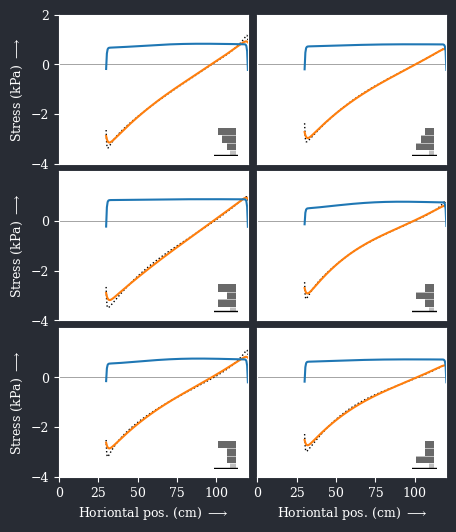

In [16]:
# Inputs
profiles = ['A', 'B', 'C', 'D', 'E', 'F']  # List of reference profile names
phi = 38                                   # Slope inclination (°)

# Initialize models for all profiles
psts = [weac.Layered(system='-pst', layers=p) for p in profiles]

# Update weak-layer thickness to match FEA
for pst in psts:
    pst.set_foundation_properties(t=20, E=0.15, update=True)

# Calculate segmentation (same for all profiles)
psgmts = psts[0].calc_segments(L=1200, a=300)['crack']

with plt.style.context('dark_background'):

    # Create figure
    fig, axs = plt.subplots(3, 2, constrained_layout=False, figsize=(5,6))
    axs = axs.flatten()
    plt.subplots_adjust(wspace=.05, hspace=.05)

    # Match figure and VS code background colors. Theme colors can be found at
    # cmd+shift+P > Developer: Generate Color Theme From Current Settings
    # For background colors see "colors": {"editor.background": ...}
    fig.set_facecolor('#282c34')

    # Adjust grid layout
    [axs[i].xaxis.set_visible(False) for i in range(4)]
    [axs[i].yaxis.set_visible(False) for i in [1,3,5]]
    [axs[i].set_ylabel(r'Stress (kPa) $\longrightarrow$') for i in [0,2,4]]
    [axs[i].set_xlabel(r'Horiontal pos. (cm) $\longrightarrow$') for i in [-1, -2]]

    # Loop through list of models
    for i, pst in enumerate(psts):

        # Dack background but light inside axes
        axs[i].set_prop_cycle(cycler)
        axs[i].set_facecolor('white')

        # Assemble model for segments and solve for free constants
        C = pst.assemble_and_solve(phi=phi, **psgmts)
        
        # Rasterize the solution
        xsl, z, xwl = pst.rasterize_solution(C=C, phi=phi, **psgmts)
        
        # Get normal and shear stresses
        xwl_cm, sig = pst.get_weaklayer_normalstress(x=xwl, z=z, unit='kPa')
        xwl_cm, tau = pst.get_weaklayer_shearstress(x=xwl, z=z, unit='kPa')
        
        # Assemble output and write to file
        output = np.vstack([xwl_cm, tau, sig]).T
        
        # Import FEA reference data
        pre = 'data/stresses_weak_layer_pst_layersetup_'
        ext = '_slope_38_crack_left.npy'
        fem = np.loadtxt(pre + profiles[i] + ext)
        
        # Plot zero axis
        axs[i].axhline(0, linewidth=0.5, color='gray')
        
        # Plot FEA data
        axs[i].plot(fem[:, 0]/10, 1e3*fem[:, 2], 'k:', linewidth=1)
        axs[i].plot(-fem[:, 0]/10, 1e3*fem[:, 3], 'k:', linewidth=1)
        
        # Plot model data
        axs[i].plot(xwl_cm, sig, colors[1])
        axs[i].plot(xwl_cm, tau, colors[0])
        
        # Show profiles
        inax = axs[i].inset_axes([.82, .05, .13, .20])
        plot_profile_pictogram(pst, inax)
        # axs[i].set_title(profiles[i], x=0.08, y=0.8)
        
        # Plot setup
        axs[i].set_xlim([0, 120])
        axs[i].set_ylim([-4, 2])
        
    # Remove overlapping tick labels
    [axs[i].set_yticks(axs[i].get_yticks()[:-1]) for i in [2, 4]];

0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)
0
False
(10, 1)


FileNotFoundError: [Errno 2] No such file or directory: 'data/err/A/present'

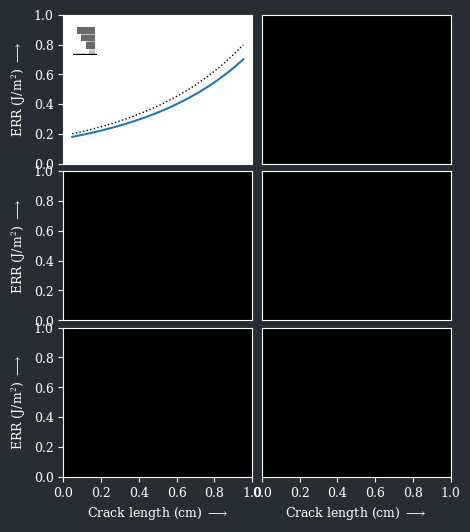

In [10]:
phi, sys = 38, '-pst'   # Upslope cut from left
# phi, sys = -38, 'pst-'  # Upslope cut from right
# phi, sys = 38, 'pst-'   # Downslope cut from right
# phi, sys = -38, '-pst'  # Downslope cut from left

# Inputs
profiles = ['A', 'B', 'C', 'D', 'E', 'F']  # List of reference profile names

# Initialize models for all profiles
psts = [weac.Layered(system=sys, layers=p) for p in profiles]

# Update weak-layer thickness to match FEA
for pst in psts:
    pst.set_foundation_properties(t=20, E=0.15, update=True)

with plt.style.context('dark_background'):

    # Create figure
    fig, axs = plt.subplots(3, 2, constrained_layout=False, figsize=(5,6))
    axs = axs.flatten()
    plt.subplots_adjust(wspace=.05, hspace=.05)

    # Match figure and VS code background colors. Theme colors can be found at
    # cmd+shift+P > Developer: Generate Color Theme From Current Settings
    # For background colors see "colors": {"editor.background": ...}
    fig.set_facecolor('#282c34')

    # Adjust grid layout
    [axs[i].xaxis.set_visible(False) for i in range(4)]
    [axs[i].yaxis.set_visible(False) for i in [1,3,5]]
    [axs[i].set_ylabel(r'ERR (J/m$^2$) $\longrightarrow$') for i in [0,2,4]]
    [axs[i].set_xlabel(r'Crack length (cm) $\longrightarrow$') for i in [-1, -2]]

    # Loop through list of models
    for i, pst in enumerate(psts):
        
        # Dack background but light inside axes
        axs[i].set_prop_cycle(cycler)
        axs[i].set_facecolor('white')
        
        # Initialize outputs and crack lengths
        da = np.arange(15,315,15)
        Gdif = np.zeros([3, len(da)])

        # Loop through crack lengths
        for j, a in enumerate(da):

            # Obtain lists of segment lengths, locations of foundations
            esgmts = pst.calc_segments(L=1200, a=a)['crack']

            # Assemble system and solve for free constants
            C = pst.assemble_and_solve(phi=phi, **esgmts)

            # Compute differential and incremental energy release rates
            Gdif[:, j] = pst.gdif(C, phi, **esgmts, unit='J/m^2')
        
        # Import FEA reference data
        pre = 'data/g_setup_'
        ext = '.npy'
        fem = np.loadtxt(pre + profiles[i] + ext)

        # Plot FEA data
        axs[i].plot(da/10, 1e3*fem[:, 0], 'k:', linewidth=1)

        # Plot model data
        axs[i].plot(da/10, Gdif[0, :], colors[0])

        # Show profiles
        inax = axs[i].inset_axes([.05, .73, .13, .20])
        plot_profile_pictogram(pst, inax)
        # axs[i].set_title(profiles[i], x=0.08, y=0.8)
        
        # Plot setup
        axs[i].set_xlim([0, 31.5])
        axs[i].set_ylim([0, 1])
        
        # Assemble outputs
        present = np.vstack([
            da/10,            # a (cm) with centered skier
            Gdif[0, :]        # Gdif (J/m^2)
        ]).T
        fea = np.vstack([
            da/10,            # a (cm) with centered skier
            1e3*fem[:, 0]     # Gdif (J/m^2)
        ]).T
        
        # Write outputs to files
        path = f'data/'
        np.savetxt(f'{path}/present', present, header='a G', comments='')
        np.savetxt(f'{path}/reference', fea, header='a G', comments='')
        
    # Remove overlapping tick labels
    [axs[i].set_yticks(axs[i].get_yticks()[:-1]) for i in [2, 4]];
    [axs[i].set_xticks(axs[i].get_xticks()[:-2]) for i in [-2]];

In [11]:
myprofile = [[170, 100],  # (1) surface layer
             [190,  40],  # (2) 2nd layer
             [230, 130],  #  :
             [250,  20],  #  :
             [210,  70],  # (i) i-th layer
             [380,  20],  #  :
             [280, 100]]  # (N) last slab layer above weak layer
pst_cut_right = weac.Layered(system='pst-', layers=myprofile)
# pst_cut_right = weac.Layered(system='pst-')

In [13]:
# Input
totallength = 2500                      # Total length (mm)
cracklength = 300                       # Crack length (mm)
inclination = -12                       # Slope inclination (°)

seg_pst = pst_cut_right.calc_segments(
    L=totallength, a=cracklength)['crack']

C_pst = pst_cut_right.assemble_and_solve(
    phi=inclination, **seg_pst)

xsl_pst, z_pst, xwl_pst = pst_cut_right.rasterize_solution(
    C=C_pst, phi=inclination, **seg_pst)

weac.plot.deformed(instance=pst_cut_right, xsl=xsl_pst, xwl=xwl_pst,
                   z=z_pst, phi=inclination, scale=500, levels=300,
                   field='principal', normalize=False, aspect=1, dark=True)

In [14]:
myprofile = [[170, 40],  # (1) surface layer
             [190, 20],  # (2) 2nd layer
             [230, 50],  #  :
             [250, 10],  #  :
             [210, 35],  # (i) i-th layer
             [380, 20],  #  :
             [280, 25]]  # (N) last slab layer above weak layer
homprofile = [[240, 200], ]
skier = weac.Layered(system='skier', layers=myprofile)
# skier = weac.Layered(system='skier', layers=homprofile)
skier.set_foundation_properties(t=20, E=0.15, update=True)
# skier.set_beam_properties(layers=homprofile, C1=4.4, update=True)
skier.set_beam_properties(layers=myprofile, C1=4.4, update=True)

In [15]:
# Input
totallength = 2e4                       # Total length (mm)
cracklength = 250                         # Crack length (mm)
inclination = -15                       # Slope inclination (°)
skierweight = 80                        # Skier weigth (kg)
dpm = 500                                # Dots per meter (plot points)

# Obtain lists of segment lengths, locations of foundations,
# and position and magnitude of skier loads from inputs. We
# can choose to analyze the situtation before a crack appears
# even if a cracklength > 0 is set by replacing the 'crack'
# key thorugh the 'nocrack' key.
seg_skier = skier.calc_segments(
    L=totallength, a=cracklength, m=skierweight)['crack']

# Assemble system of linear equations and solve the
# boundary-value problem for free constants.
C_skier = skier.assemble_and_solve(
    phi=inclination, **seg_skier)

# Calculate number of plot points
num = int(1e-3*totallength*dpm/2)

# Prepare the output by rasterizing the solution vector at all
# horizontal positions xsl (slab). The result is returned in the
# form of the ndarray z. Also provides xwl (weak layer) that only
# contains x-coordinates that are supported by a foundation.
xsl_skier, z_skier, xwl_skier = skier.rasterize_solution(
    C=C_skier, phi=inclination, **seg_skier, num=num)

weac.plot.deformed(skier, xsl=xsl_skier, xwl=xwl_skier, z=z_skier,
                   phi=inclination, window=200, scale=100, aspect=2,
                   field='principal', normalize=True, dark=True)

(28, 501)
(2, 501)


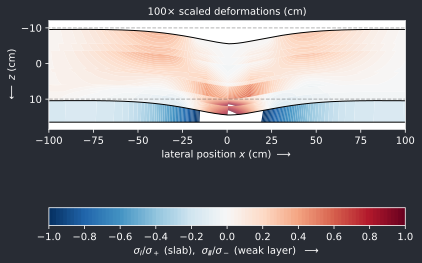

In [44]:
scale = 100
window = 200
dz = 10

zi = skier.get_zmesh(dz=dz)[:, 0]
Sxx = skier.Sxx(z_skier, inclination, dz=dz)
Txz = skier.Txz(z_skier, inclination, dz=dz)
Szz = skier.Szz(z_skier, inclination, dz=dz)

ps = skier.principal_stress_slab(
   z_skier, inclination, dz=dz, val='max', normalize=True)

# ps = np.amax([(Sxx + Szz) + np.sqrt((Sxx - Szz)**2 + 4*Txz**2),
#               (Sxx + Szz) - np.sqrt((Sxx - Szz)**2 + 4*Txz**2)], axis=0)/2

stresssl = ps
minmax = 1
levels = np.linspace(-minmax, minmax, num=101, endpoint=True)

with plt.style.context('dark_background'):
    
        fig = plt.figure()
        ax = plt.gca()
        fig.set_facecolor('#282c34')
        ax.set_facecolor('white')
        
        # === SLAB ============================================================
        
        # Compute displacements on grid (cm)
        Usl = 1e-1*np.vstack([skier.u(z_skier, z0=y, unit='mm') for y in zi])
        Wsl = 1e-1*np.vstack([skier.w(z_skier, unit='mm') for _ in zi])
        
        # Put coordinate origin at horizontal center
        xsl = xsl_skier - max(xsl_skier)/2
        
        # Compute grid coordinates with vertical origin at top surface (cm)
        Xsl, Zsl = np.meshgrid(1e-1*(xsl), 1e-1*zi)

        # Plot outline
        plt.plot(weac.plot.outline(Xsl),
                 weac.plot.outline(Zsl), 'k--', alpha=0.3, linewidth=1)
        plt.plot(weac.plot.outline(Xsl+scale*Usl),
                 weac.plot.outline(Zsl+scale*Wsl), 'k', linewidth=1)
        
        # Get x-coordinate of maximum deflection w (cm) and derive plot limits
        xfocus = xsl[np.max(np.argmax(Wsl, axis=1))]/10
        xmax = np.min([np.max(Xsl+scale*Usl), xfocus + window/2])
        xmin = np.max([np.min(Xsl+scale*Usl), xfocus - window/2])
        
        # Normalize colormap
        norm = weac.plot.MidpointNormalize(
                vmin=np.min(stresssl), vmax=np.max(stresssl))
        
        plt.contourf(Xsl+scale*Usl,
                     Zsl+scale*Wsl,
                     stresssl,
                     levels=levels,
                     cmap='RdBu_r')
                     # norm=norm)  # RdBu_r RdGy

      #   cbar = plt.colorbar(
      #           orientation='horizontal',
      #           ticks=levels[::10],
      #           label=(r'slab $\sigma_I/\sigma_+$ $\longrightarrow$'))
        
        # === WEAK LAYER ======================================================
        
        # Plot base
      #   zmax = (skier.h/2 + 4*skier.t)/10 # + scale*Wsl[-1, 0]  # 3x t
        zmax = np.max(Zsl + scale*Wsl) + 2
        plt.axhline(zmax, color='k', linewidth=1)
        
        # Put coordinate origin at horizontal center
        xwl = xwl_skier - max(xwl_skier)/2
        
        # Compute grid coordinates with vertical origin at top surface (cm)
        Xwl, Zwl = np.meshgrid(1e-1*xwl, [1e-1*zi[-1], zmax])
        
        # Compute weak-layer topside displacements
      #   Uwl = np.row_stack([Usl[-1, :], Usl[-1, :]])
        Uwl = np.row_stack([Usl[-1, :], np.zeros(xwl.shape[0])])
        Wwl = np.row_stack([Wsl[-1, :], np.zeros(xwl.shape[0])])
        
        # Compute weak-layer stresses
        tauwl = skier.get_weaklayer_shearstress(
                x=xwl, z=z_skier, unit='kPa')[1]
        sigwl = skier.get_weaklayer_normalstress(
                x=xwl, z=z_skier, unit='kPa')[1]
        
        # Get weak-layer minimum principal stress
        pswl = np.amin([sigwl + np.sqrt(sigwl**2 + 4*tauwl**2),
                        sigwl - np.sqrt(sigwl**2 + 4*tauwl**2)], axis=0)/2
     
        # Stack weak-layer stresses (top, bot) and normalize to strenth
        stresswl = np.row_stack([pswl, pswl])/2.6
      #   stresswl = np.row_stack([tauwl, tauwl])
        
        # Normalize weak-layer colormap
        normwl = weac.plot.MidpointNormalize(vmin=np.min(stresswl),
                                             vmax=np.max(stresswl))
        
        # Plot deformed weak layer
        plt.contourf(Xwl+scale*Uwl,
                     Zwl+scale*Wwl,
                     stresswl,
                     levels=levels,
                     cmap='RdBu_r')
                     # norm=normwl) # GnBu_r RdGy
        
        plt.colorbar(
                orientation='horizontal',
                ticks=levels[::10],
                label=(
                   r'$\sigma_I/\sigma_+$ (slab),  ' + 
                   r'$\sigma_{I\!I\!I}/\sigma_-$ (weak layer)  ' +
                   r'$\longrightarrow$'))
        
        # Plot setup
        ax.axis('scaled')
        ax.set_xlim([xmin, xmax])
        ax.set_ylim([np.min(Zsl) - 2, zmax + 2])
        ax.set_aspect(2)
        ax.invert_yaxis()
        ax.use_sticky_edges = False
        
        # Plot labels
        ax.set_xlabel(r'lateral position $x$ (cm) $\longrightarrow$')
        ax.set_ylabel(r'$\longleftarrow $ $z$ (cm)')
        plt.title(fr'${scale}\!\times\!$ scaled deformations (cm)', size=10)

        # === EXPORT ==========================================================

        # Prepare size reduction
        rowmask = np.array(xsl/10 >= -window/2) & np.array(xsl/10 <= window/2)
        colskip = int((len(zi) - 1)/20)
        
        # Slab output arrays
        outXsl = (Xsl + scale*Usl)[::colskip, rowmask]
        outYsl = (Zsl + scale*Wsl)[::colskip, rowmask]
        outZsl = stresssl[::colskip, rowmask]
        
        # Weak-layer output arrays
        outXwl = (Xwl + scale*Uwl)[:, rowmask]
        outYwl = (Zwl + scale*Wwl)[:, rowmask]
        outZwl = stresswl[:, rowmask]
        
        # Prepare ourputs
        sldata = np.vstack([
            outXsl.flatten(),
            outYsl.flatten(),
            outZsl.flatten()]).T
        wldata = np.vstack([
            outXwl.flatten(),
            outYwl.flatten(),
            outZwl.flatten()]).T
        
        # Outlines
        top = np.vstack([outXsl[0, :], outYsl[0, :]]).T
        mid = np.vstack([outXsl[-1, :], outYsl[-1, :]]).T
        bot = np.vstack([outXsl[-1, [0, -1]], [zmax, zmax]]).T
        
        # Original shape
        OGtop = np.vstack([Xsl[0, rowmask], Zsl[0, rowmask]]).T
        OGmid = np.vstack([Xsl[-1, rowmask], Zsl[-1, rowmask]]).T
        OGbot = np.vstack([Xsl[:, rowmask][-1, [0, -1]], [zmax, zmax]]).T
        
        # Meta
        path = f'data/contour/'
        
        # Write fields
        header = 3*'%15s ' % ('x(cm)', 'z(cm)', 'stress(kPa)')
        np.savetxt(path + 'slab', sldata, fmt='%15.8f', delimiter=' ',
           header=header, comments='')
        np.savetxt(path + 'weaklayer', wldata, fmt='%15.8f', delimiter=' ',
           header=header, comments='')
        
        # Write outlines
        header = 2*'%15s ' % ('x(cm)', 'y(cm)')
        np.savetxt(path + 'topline', top, fmt='%15.8f', delimiter=' ',
           header=header, comments='')
        np.savetxt(path + 'midline', mid, fmt='%15.8f', delimiter=' ',
           header=header, comments='')
        np.savetxt(path + 'botline', bot, fmt='%15.8f', delimiter=' ',
           header=header, comments='')
        
        # Write undeformed shape
        header = 2*'%15s ' % ('x(cm)', 'y(cm)')
        np.savetxt(path + 'topinit', OGtop, fmt='%15.8f', delimiter=' ',
           header=header, comments='')
        np.savetxt(path + 'midinit', OGmid, fmt='%15.8f', delimiter=' ',
           header=header, comments='')
        np.savetxt(path + 'botinit', OGbot, fmt='%15.8f', delimiter=' ',
           header=header, comments='')
        
        # TiKZ info
        print(outZsl.shape)
        print(outZwl.shape)
        

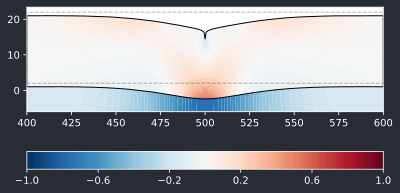

In [45]:
# Number of plot points (slab)
nxsl = 201 # 101
nysl = 26

# Number of plot points (weak layer)
nxwl = 101
nywl = 13

# Number of variables (x, y, u, v, stress)
nvar = 5

# Scaling factors
sdisp = 200         # Displacements
swl = 4             # Weak-layer thickness

# Import data
slab = np.loadtxt('data/contour/plotdataSlab-v3.npy')
weak = np.loadtxt('data/contour/plotdataWeakLayer.npy')

# Unit conversions (mm, mm, mm, mm, MPa) -> (cm, cm, cm, cm, kPa)
conversions = np.array([1e-1, 1e-1, 1e-1, 1e-1, 1e3])
slab *= conversions
weak *= conversions

# Sort by X
slab = slab[slab[:, 0].argsort()]
weak = weak[weak[:, 0].argsort()]

# Sort by Y respecting precious sort order
slab = slab[slab[:, 1].argsort(kind='mergesort')]
weak = weak[weak[:, 1].argsort(kind='mergesort')]

# Reshape and unpack
Xsl, Ysl, Usl, Vsl, Zsl = [field for field in slab.T.reshape(nvar, nysl, nxsl)]
Xwl, Ywl, Uwl, Vwl, Zwl = [field for field in weak.T.reshape(nvar, nywl, nxwl)]

# Slab output arrays
outXsl = Xsl + sdisp*Usl
outYsl = Ysl + sdisp*Vsl
outZsl = Zsl/9    # 9.1

# Weak-layer output arrays
outXwl = Xwl + sdisp*Uwl
outYwl = Ywl[-1, 0] + swl*(Ywl - Ywl[-1, 0]) + sdisp*Vwl
outZwl = Zwl/2.6

with plt.style.context('dark_background'):

    # Create figure
    fig = plt.figure()
    ax = plt.gca()
    fig.set_facecolor('#282c34')
    ax.set_facecolor('white')
    
    # Color levels
    levels = np.linspace(-1, 1, num=101, endpoint=True)
    
    # Plot slab
    plt.contourf(outXsl, outYsl, outZsl, levels=levels, cmap='RdBu_r')
    
    # Plot weak layer
    plt.contourf(outXwl, outYwl, outZwl, levels=levels, cmap='RdBu_r')

    # Plot slab outlines
    plt.plot(weac.plot.outline(Xsl), weac.plot.outline(Ysl),
             'k--', alpha=0.3, linewidth=1)
    plt.plot(weac.plot.outline(outXsl), weac.plot.outline(outYsl),
             'k', linewidth=1)

    # Plot setup
    ax.axis('scaled')
    # ax.set_xlim([xmin, xmax])
    # ax.set_ylim([np.min(Z) - 2, zmax + 2])
    ax.set_aspect(2)
    # ax.invert_yaxis()
    ax.use_sticky_edges = False
    
    # Show color bar
    plt.colorbar(orientation='horizontal', ticks=levels[::20])
    
# Prepare ourputs
sldata = np.vstack([
    outXsl.flatten(),
    outYsl.flatten(),
    outZsl.flatten()]).T
wldata = np.vstack([
    outXwl.flatten(),
    outYwl.flatten(),
    outZwl.flatten()]).T

# Outlines
top = np.vstack([outXsl[-1, :], outYsl[-1, :]]).T
mid = np.vstack([outXsl[0, :], outYsl[0, :]]).T
bot = np.vstack([outXwl[0, :], outYwl[0, :]]).T

# Original shape
OGtop = np.vstack([Xsl[-1, :], Ysl[-1, :]]).T
OGmid = np.vstack([Xsl[0, :], Ysl[0, :]]).T
# OGbot = np.vstack([Xsl[:, :][-1, [0, -1]], [zmax, zmax]]).T

# Meta
path = f'data/contour/'

# Write fields
header = 3*'%15s ' % ('x(cm)', 'z(cm)', 'stress(kPa)')
np.savetxt(path + 'slab_fea', sldata, fmt='%15.8f', delimiter=' ',
    header=header, comments='')
np.savetxt(path + 'weaklayer_fea', wldata, fmt='%15.8f', delimiter=' ',
    header=header, comments='')

# Write outlines
header = 2*'%15s ' % ('x(cm)', 'y(cm)')
np.savetxt(path + 'topline_fea', top, fmt='%15.8f', delimiter=' ',
    header=header, comments='')
np.savetxt(path + 'midline_fea', mid, fmt='%15.8f', delimiter=' ',
    header=header, comments='')
np.savetxt(path + 'botline_fea', bot, fmt='%15.8f', delimiter=' ',
    header=header, comments='')

# Write undeformed shape
header = 2*'%15s ' % ('x(cm)', 'y(cm)')
np.savetxt(path + 'topinit_fea', OGtop, fmt='%15.8f', delimiter=' ',
    header=header, comments='')
np.savetxt(path + 'midinit_fea', OGmid, fmt='%15.8f', delimiter=' ',
    header=header, comments='')
# np.savetxt(path + 'botinit_fea', OGbot, fmt='%15.8f', delimiter=' ',
#     header=header, comments='')

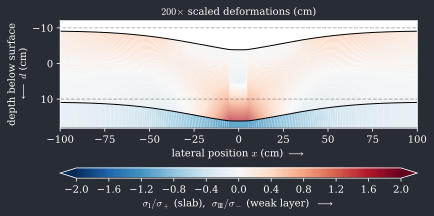

In [25]:
# Input
li = [5e3, 100, 5e3]        # Beam segment lengths (mm)
ki = [True, True, True]     # Foundation (bedded/free = True/False)
mi = [80, 80]               # Skier weights [kg]
inclination = 0             # Slope inclination (°)

skiers_on_B = weac.Layered(system='skiers')

# Obtain lists of segment lengths, locations of foundations,
# and position and magnitude of skier loads from inputs. If,
# in addition, a list k0 is passed to calc_segments, we may
# replace the 'crack' key by the 'nocrack' key to toggle
# between cracked (ki) and uncracked (k0) configurations.
seg_skiers = skiers_on_B.calc_segments(
    li=li, ki=ki, mi=mi)['crack']

# Assemble system of linear equations and solve the
# boundary-value problem for free constants.
C_skiers = skiers_on_B.assemble_and_solve(
    phi=inclination, **seg_skiers)

# Prepare the output by rasterizing the solution vector at all
# horizontal positions xsl (slab). The result is returned in the
# form of the ndarray z. Also provides xwl (weak layer) that only
# contains x-coordinates that are supported by a foundation.
xsl_skiers, z_skiers, xwl_skiers = skiers_on_B.rasterize_solution(
    C=C_skiers, phi=inclination, **seg_skiers, num=2000)

weac.plot.deformed(skiers_on_B, xsl=xsl_skiers, xwl=xwl_skiers, z=z_skiers,
                   phi=inclination, window=200, scale=200, aspect=2,
                   field='principal', normalize=True, dark=True)